# Directional Wave spectrum

In this notebook, we introduce an additional dimension to the wave spectrum computed in [the previous notebook](./spectral_analysis_on_geo_record.ipynb) . We are continuing to work with CDIP buoy data.

As previously discussed, the surface elevation record is one-dimensional (varying only in time), which prevents us from directly extracting directional information. However, the buoy experiences motion not only along the vertical axis but also in the horizontal plane as waves pass. In the CDIP buoy dataset these motions are also stored. Refer to Cartwright, D.E. and Longuet-Higgins, M.S., 1956 ;  Lygre, A. and Krogstad, H.E., 1986 to see how the buoy motions in three-dimension can be leveraged to get directional wave informations.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
from IPython.display import Image

In [2]:
enter_date = np.datetime64('2025-09-01') # change the date here

### The buoy motion in a three-dimension framework

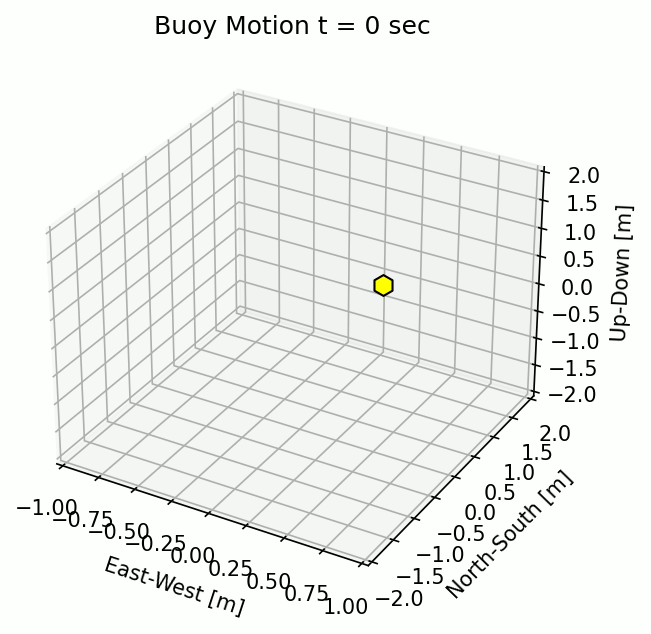

In [3]:
Image(filename="threeD_Buoy_obs.gif")

In [4]:
g = 9.81 #  acceleration of gravity



def period_from_wavelength(WL):
	T=np.sqrt(2*np.pi*WL/9.81) #wind waves in deep water : dispersion relation

	return T


#2D wave spectrum

def buoy_spectrum2d(sf,a1,a2,b1,b2, dirs = np.arange(0,365,10)):
    """(a1,a2,b1,b2,en,ndirs):
    purpose: compute spectrum(f,theta) from coef ai,bi
    author: Wang He
    # Maximum entropy method to estimate the Directional Distribution
    
    # Maximum Entropy Method - Lygre & Krogstad (1986 - JPO)
    # Eqn. 13:
    # phi1 = (c1 - c2c1*)/(1 - abs(c1)^2)
    # phi2 = c2 - c1phi1
    # 2piD = (1 - phi1c1* - phi2c2*)/abs(1 - phi1exp(-itheta) -phi2exp(2itheta))^2
    # c1 and c2 are the complex fourier coefficients
    
    # inputs : dirs in degrees
    """
    nfreq = np.size(sf)
    nbin = np.size(dirs)
    
    c1 = a1+1j*b1
    c2 = a2+1j*b2
    p1 = (c1-c2*np.conj(c1))/(1.-abs(c1)**2)
    p2 = c2-c1*p1
    
    # numerator(2D) : x
    x = 1.-p1*np.conj(c1)-p2*np.conj(c2)
    x = np.tile(np.real(x),(nbin,1)).T
    
    # denominator(2D): y
    a = dirs*np.pi/180.
    e1 = np.tile(np.cos(a)-1j*np.sin(a),(nfreq,1))
    e2 = np.tile(np.cos(2*a)-1j*np.sin(2*a),(nfreq,1))
    
    p1e1 = np.tile(p1,(nbin,1)).T*e1
    p2e2 = np.tile(p2,(nbin,1)).T*e2
    
    y = abs(1-p1e1-p2e2)**2
    
    D = x/(y*2*np.pi)
    
    # normalizes the spreading function,
    # so that int D(theta,f) dtheta = 1 for each f  
    dth = dirs[1]-dirs[0]

    tot = np.tile(np.sum(D, axis=1)*dth/180.*np.pi,(nbin,1)).T
    D = D/tot
    
    sp2d = np.tile(sf,(nbin,1)).T*D
    
    return sp2d,D

def plot_polar_spectrum(dirspec, DIRS, FREQS, time_spec, vmin0 = 0, vmax0 = 30, cbar = 0, date_on = 0):
    
    """
    Purpose: Plot the direction-frequency spectrum in a polar coordinate
    ----------
    inputs:
    --------
    dirspec: the directional spectrum
    DIRS: the 2D axis of direction (in rad!)
    FREQS: the 2D axis of frequency
    time_spec: the date when the spectrum is calculated
    vmin0, vmax: the bounds of values plot in the polar plot
    cbar, date_on: switch to activate or not the date and the colorbar
    
    output:
    --------
    empty
    """      
    fig,ax=plt.subplots(subplot_kw={'projection': 'polar'})
    p1 = plt.pcolor(DIRS, FREQS, dirspec.T, vmin = vmin0, vmax = vmax0, cmap = 'Blues')
    plt.ylim([0,0.3])
    ax.set_rmax(.20)
    ax.set_theta_offset(np.pi/2)
    ax.set_theta_direction(-1)
    plt.tight_layout()
    angle_labels = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W','NW']
    ax.set_rlabel_position(180 + 45)
    #ax.set_ylim(0, 30)#set_rmax(30)
    #ax.set_ylabels('Wave period [s]', labelpad = 20)
    ax.set_thetagrids(angles = range(0, 360, 45),
                          labels = angle_labels,fontsize=12)


    #############,
    #---White circles
    #############
    radius_050m=np.sqrt(g*2*np.pi/(50.*4*np.pi**2))
    radius_100m=np.sqrt(g*2*np.pi/(100.*4*np.pi**2))
    radius_200m=np.sqrt(g*2*np.pi/(200.*4*np.pi**2))
    radius_500m=np.sqrt(g*2*np.pi/(500.*4*np.pi**2))
    #radius_300m=(2*np.pi)/300.


    circle1 = plt.Circle((0.0, 0.0), radius_050m, color='k',transform=ax.transData._b,linestyle='--',fill=False)
    ax.add_patch(circle1)
    circle2 = plt.Circle((0.0, 0.0), radius_100m, color='k',transform=ax.transData._b,linestyle='--',fill=False)
    ax.add_patch(circle2)
    circle3 = plt.Circle((0.0, 0.0), radius_200m, color='k',transform=ax.transData._b,linestyle='--',fill=False)
    ax.add_patch(circle3)
    circle4 = plt.Circle((0.0, 0.0), radius_500m, color='k',transform=ax.transData._b,linestyle='--',fill=False)
    ax.add_patch(circle4)
    plt.text(0,radius_050m,'50 m',color='k')
    plt.text(0,radius_100m,'100 m',color='k')
    plt.text(0,radius_200m,'200 m',color='k')
    plt.text(0,radius_500m,'500 m',color='k')

    ax.set_yticklabels([])

    ax.text(150*np.pi/180,.3,'CDIP', fontsize=16)
    ax.set_title(time_spec)
    if cbar==1:
        cbar_ax = fig.add_axes([0.2, .08, .2, 0.05])
        cbar=fig.colorbar(p1, cax=cbar_ax, shrink=0.5,aspect=155,extend='max',orientation='horizontal')
        cbar.ax.tick_params(labelsize=12) 
        cbar.ax.set_xlabel(' [m²/rad/Hz]',rotation=0,fontsize=15)
    ax.set_aspect('equal', 'box')
    plt.tight_layout()

### Load Data
Here we consider the spectral wave data (not the data in the physical space)

In [5]:
file_buoy = './data/spectral_wave_data_cdip.nc'
ds_buoy = xr.open_dataset(file_buoy)
ds_buoy = ds_buoy.sel(waveTime = enter_date, method = 'nearest')

### *The first fives*. 
The $a1, b1, a2, b2$ parameters are the angular fourier coefficients that are leveraged to get the directional wave informations. The Wave Energy Density (the so-call wave spectrum on the [previous notebook](./spectral_analysis_on_geo_record.ipynb)) provides the level of energy that is distributed along the directions

In [6]:
ef = ds_buoy.waveEnergyDensity.values
a1 = ds_buoy.waveA1Value.values
b1 = ds_buoy.waveB1Value.values
a2 = ds_buoy.waveA2Value.values
b2 = ds_buoy.waveB2Value.values

freq = ds_buoy.waveFrequency.values
step_angle = 5

### Compute the directional wave spectrum.
Here we use the Maximum Entropy Method (Lygre, A. and Krogstad, H.E., 1986). The directional wave spectrum provides the distribution of the wave energy along frequencies (wavenumber/period/wavelength) and direction. Basically, from the wave spectrum you can tell the length of the dominants waves and where they are going (coming) to (from). For you information, the wave spectrum is the variable solved by operational wave models used in wave forecasting (MARC-Previmer, Windy, Windguru, ...)

In [7]:
dirs = np.arange(0, 365, step_angle)
E_fth, _= buoy_spectrum2d(ef, a1, a2, b1, b2, dirs = dirs)

In [8]:
plot_polar_spectrum?

/var/folders/bx/gz6w8d_533x2h1m1pq2pt88m0000gn/T/ipykernel_26948/2379821450.py:129: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


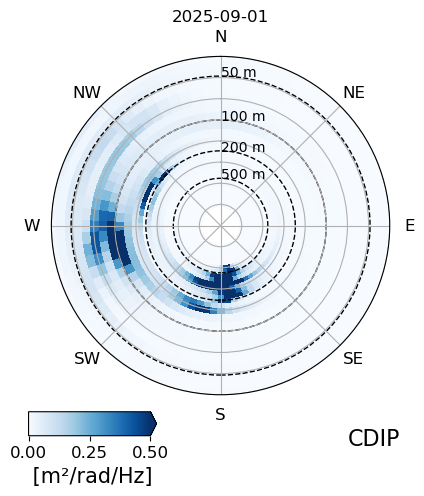

In [9]:
DIRS, FREQS = np.meshgrid(dirs * np.pi/180, freq)
plot_polar_spectrum(E_fth.T, DIRS, FREQS, enter_date, vmin0 = 0, vmax0 = .5, cbar = 1, date_on = 0)

So here, they are three wave systems.
 - A long wave system (~300 m) is coming from the south
 - A second long wave system (~ 200 m) is coming from the north-west
 - The shortest wave system is coming from the west with a wavelength between 50 and 100 m (certainly driven by local wind)

In [10]:
dtheta = np.diff(dirs * np.pi/180)[0]
df = np.gradient(freq) # here, we use the gradient function because the frequency step is not constant
print(f'The associated significant wave height is {4*np.sqrt(np.sum(np.sum(E_fth.T*df, axis = 1), axis = 0)*dtheta)} m')

The associated significant wave height is 1.1182255890511594 m


Note that, based on the Parseval theorem, as the variance of the signal is conserved by the Fourier Transform, i.e. $E=\int _{-\infty }^{+\infty }|x(t)|^{2}~\mathrm {d} t=\int _{-\infty }^{+\infty }|X(f)|^{2}~\mathrm {d} f$, one can compute the significant wave height from the wave spectrum by integrating it

### References

- Lygre, A. and Krogstad, H.E., 1986. Maximum entropy estimation of the directional distribution in ocean wave spectra. Journal of Physical Oceanography, 16(12), pp.2052-2060.
- Cartwright, D.E. and Longuet-Higgins, M.S., 1956. The statistical distribution of the maxima of a random function. Proceedings of the royal society of london. series a. mathematical and physical sciences, 237(1209), pp.212-232.